# CellOracle PART I: PAGA, DrawGraphs, Trajectories and Pseudotime

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import scipy.io
import scvelo as scv
from scipy.sparse import csr_matrix
import numpy as np
import matplotlib.pyplot as plt
import anndata as ad
import seaborn as sns
from matplotlib import pylab
%matplotlib inline
import igraph as ig
import scanpy.external as sce
import warnings
#import harmonypy


import random
import seaborn as sb

#import celloracle as co
#from celloracle import motif_analysis as ma
#from celloracle.utility import save_as_pickled_object
#from celloracle.applications import Pseudotime_calculator
# co.__version__
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
import gc
gc.collect()
# check scanpy version
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, dpi_save = 180, transparent = 'False', color_map = 'viridis',fontsize=12)
%matplotlib inline

scanpy==1.9.8 anndata==0.9.2 umap==0.5.4 numpy==1.24.4 scipy==1.10.1 pandas==1.5.3 scikit-learn==1.3.1 statsmodels==0.14.0 igraph==0.11.4 louvain==0.8.2 pynndescent==0.5.10


In [2]:
outdir="/group/testa/Project/CBOProgPools/"

sc.settings.autosave = True
sc.settings.figdir = outdir
sc.settings.verbosity = 4

scv.settings.autosave = True
scv.settings.figdir = outdir
scv.settings.verbosity = 4

pylab.rcParams['figure.figsize'] = (5, 5)

In [6]:
adata = sc.read_h5ad("/group/testa/Users/marina.fuster/dockerbase/ResultsAllCells/renamed_mixed_cells_results.h5ad")
adata 

AnnData object with n_obs × n_vars = 353683 × 19914
    obs: 'phase', 'stage', 'celltype2', 'Dataset', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'leiden', 'celltype', 'leiden_harmony', 'IP_score', 'GABA_score', 'astro_score'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'ribo', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Dataset_colors', 'celltype2_colors', 'celltype_colors', 'hvg', 'leiden', 'leiden_colors', 'leiden_harmony_colors', 'leiden_sizes', 'log1p', 'neighbors', 'paga', 'pca', 'stage_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'Raw', 'logNorm', 'normalized'
    obsp: 'connectivities', 'distances'

In [4]:
adata.obs_keys()

['phase',
 'stage',
 'celltype2',
 'Dataset',
 'n_genes',
 'n_genes_by_counts',
 'total_counts',
 'total_counts_mt',
 'pct_counts_mt',
 'total_counts_ribo',
 'pct_counts_ribo',
 'leiden',
 'celltype',
 'leiden_harmony',
 'IP_score',
 'GABA_score',
 'astro_score']

In [4]:
sc.tl.paga(adata, groups='celltype')

In [5]:
adata.obs.celltype.value_counts()

ExcMat       114389
MatUpp        95449
oRG           36648
MatExc        28331
MigExc        23882
vRG           23292
Inter         11302
microglia      7827
pericytes      5079
IP             2833
DeepLayer      2556
Mixed          2095
Name: celltype, dtype: int64

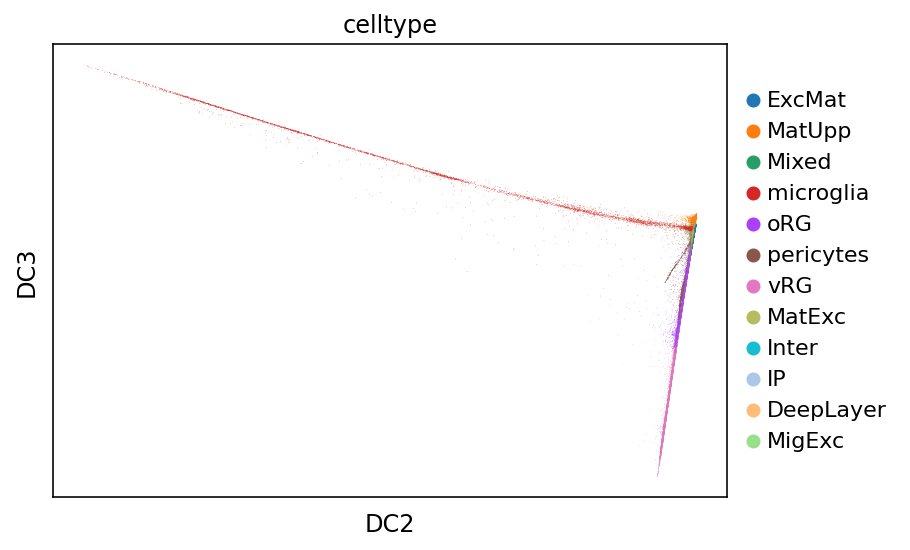

In [6]:
sc.tl.diffmap(adata)
sc.pl.diffmap(adata, color='celltype', dimensions=(1,2))

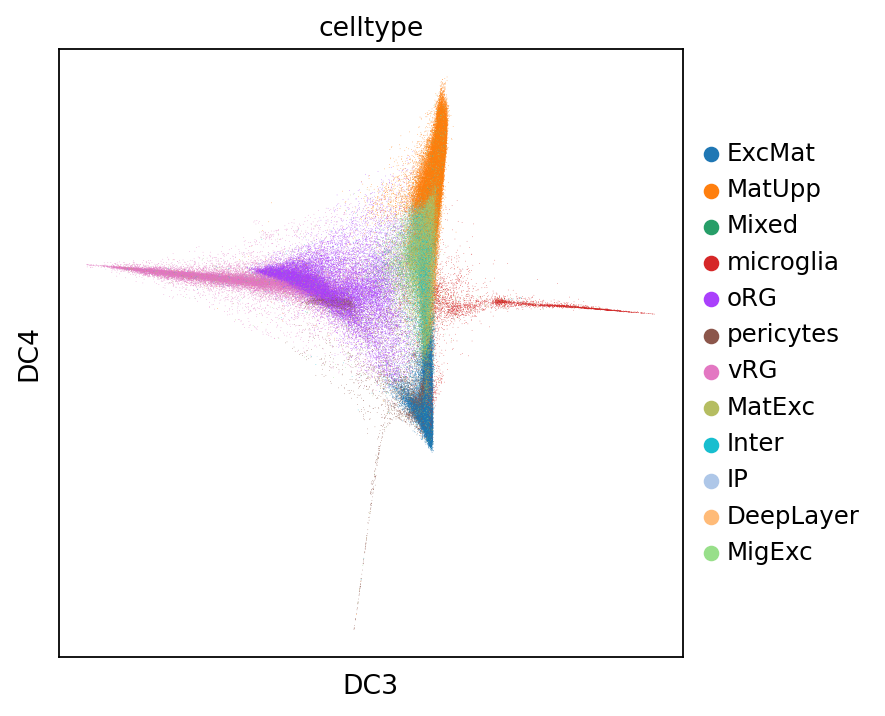

In [7]:
sc.pl.diffmap(adata, color='celltype', dimensions=(2,3))

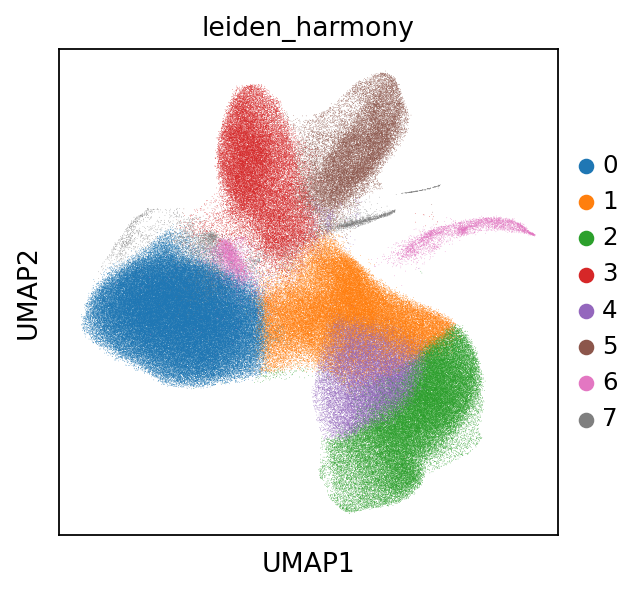

In [7]:
sc.pl.umap(adata, color='leiden_harmony')

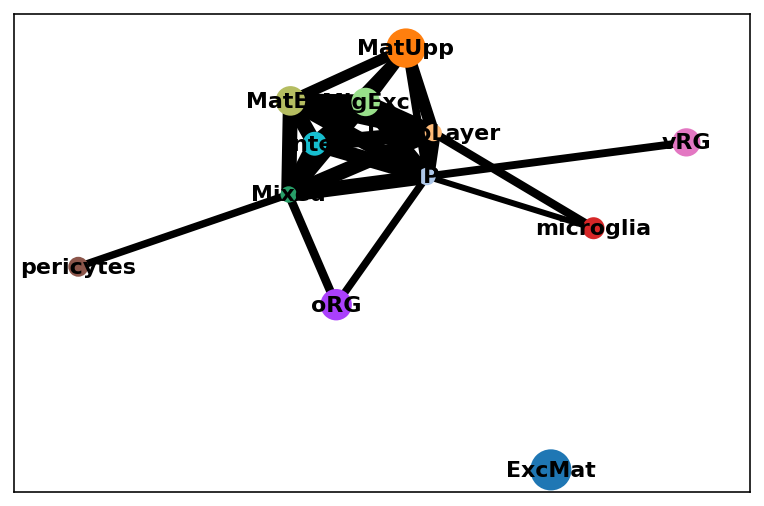

In [10]:
sc.pl.paga(adata,threshold=0.4)

In [11]:
sc.tl.draw_graph(adata, init_pos='diffmap', random_state=123)

In [12]:
adata.write_h5ad("/group/testa/Users/marina.fuster/dockerbase/ResultsOracle/results_draw_graph.h5ad")

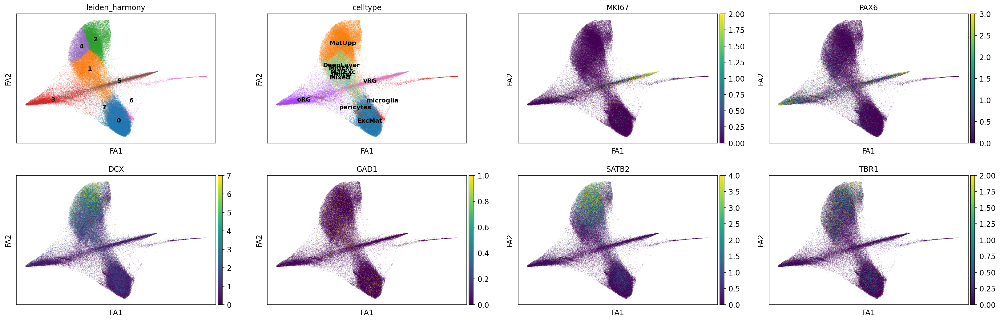

In [13]:
sc.pl.draw_graph(adata, color=['leiden_harmony','celltype','MKI67','PAX6','DCX','GAD1',"SATB2","TBR1"], legend_loc='on data',vmin='p1',vmax='p99')

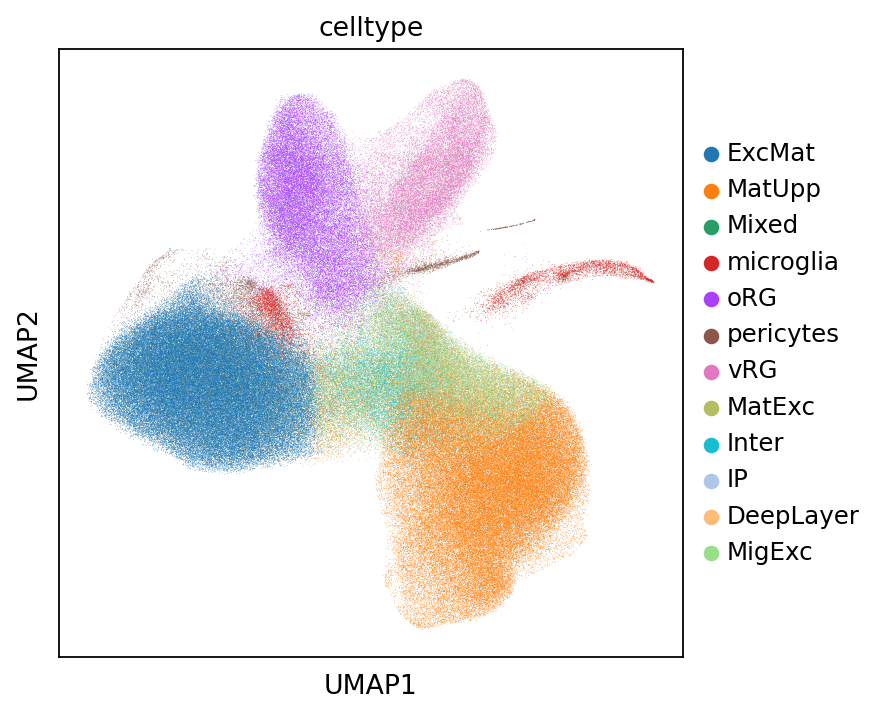

In [8]:
sc.pl.umap(adata,color='celltype')

In [15]:
adata.write_h5ad("/group/testa/Users/marina.fuster/dockerbase/ResultsOracle/results_plot_draw_graph.h5ad")

In [2]:
adata = sc.read_h5ad("/group/testa/Users/marina.fuster/dockerbase/ResultsOracle/results_plot_draw_graph.h5ad")

In [9]:
#
adata.uns['log1p']['base'] = None
sc.tl.rank_genes_groups(adata, 'celltype', method='wilcoxon',key_added = "wilcoxon",use_raw=False)


ranking genes
    consider 'celltype' groups:
    with sizes: [114389  95449   2095   7827  36648   5079  23292  28331  11302   2833
   2556  23882]
    finished: added to `.uns['wilcoxon']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:24:49)


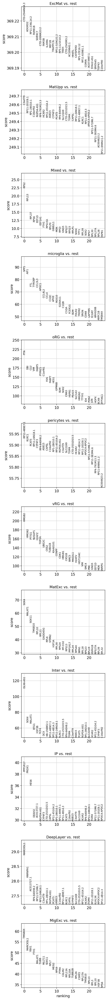

In [13]:
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False, key = "wilcoxon",ncols=1)

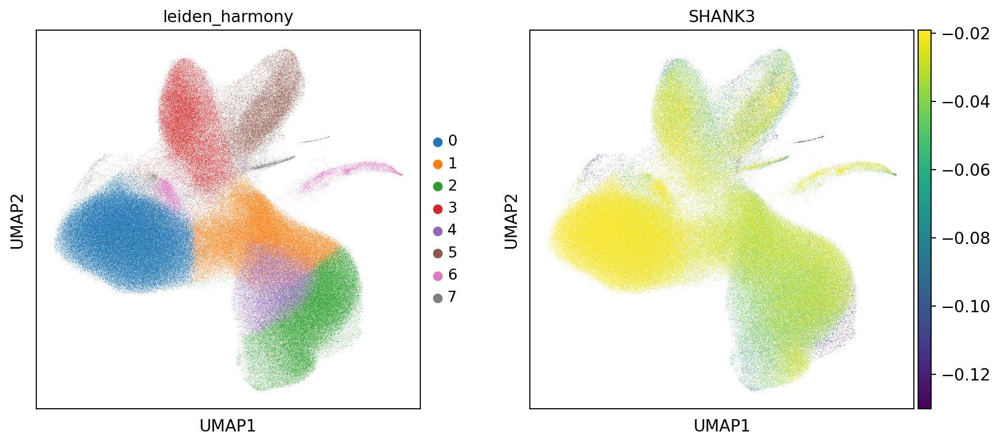

In [17]:
sc.pl.umap(adata,color=['leiden_harmony'], vmin='p1', vmax='p99', use_raw=False)

In [18]:
er_stress = ["CHOP", "DDIT3", "XBP1", "DDIT4", "P4HB" ,"ARCN1","COPD","GORASP2","GRS2"] #
glycolysis = ["ENO", "HK2", "PGK1", "GAPDH"] # genes of glycolisis
hypoxia = ["PDK1", "PHD", "GLUT1", "SLC2A1"] # hypoxia genes 
sc.tl.score_genes(adata, er_stress,score_name='ERstress_score')
sc.tl.score_genes(adata, glycolysis,score_name='glycolysis_score')
sc.tl.score_genes(adata, hypoxia,score_name='hypoxia_score')

computing score 'ERstress_score'
    finished: added
    'ERstress_score', score of gene set (adata.obs).
    200 total control genes are used. (0:00:04)
computing score 'glycolysis_score'
    finished: added
    'glycolysis_score', score of gene set (adata.obs).
    100 total control genes are used. (0:00:03)
computing score 'hypoxia_score'
    finished: added
    'hypoxia_score', score of gene set (adata.obs).
    100 total control genes are used. (0:00:03)


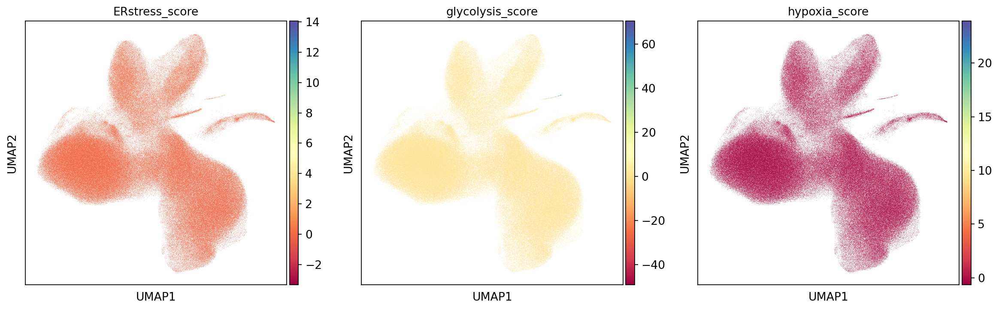

In [22]:
# CHECKED FOR STRESSED LEVELS BASED ON SIGNATURES ON ER, GLYCO AND HYPOX... AND WE DONT SEE ANY ISSUES ==> 
sc.pl.umap(adata,color=['ERstress_score','glycolysis_score','hypoxia_score'], palette='viridis',color_map='Spectral')

In [25]:
tmp= adata[adata.obs.celltype.isin(['vRG','oRG','MigExc','IP','DeepLayer','MatUpp','MatExc','Inter'])].copy()


In [28]:
sc.tl.diffmap(tmp)

computing Diffusion Maps using n_comps=15(=n_dcs)
        initialized `.distances` `.connectivities` `.eigen_values` `.eigen_basis` `.distances_dpt`
computing transitions
    finished (0:00:02)
    eigenvalues of transition matrix
    [ 1.          0.99999994  0.99720407  0.99609315  0.9955002   0.99498355
      0.9929952   0.9916358   0.9853214   0.98097736  0.9760439   0.97567
      0.97542864  0.97470665 -0.99999994]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:01:32)


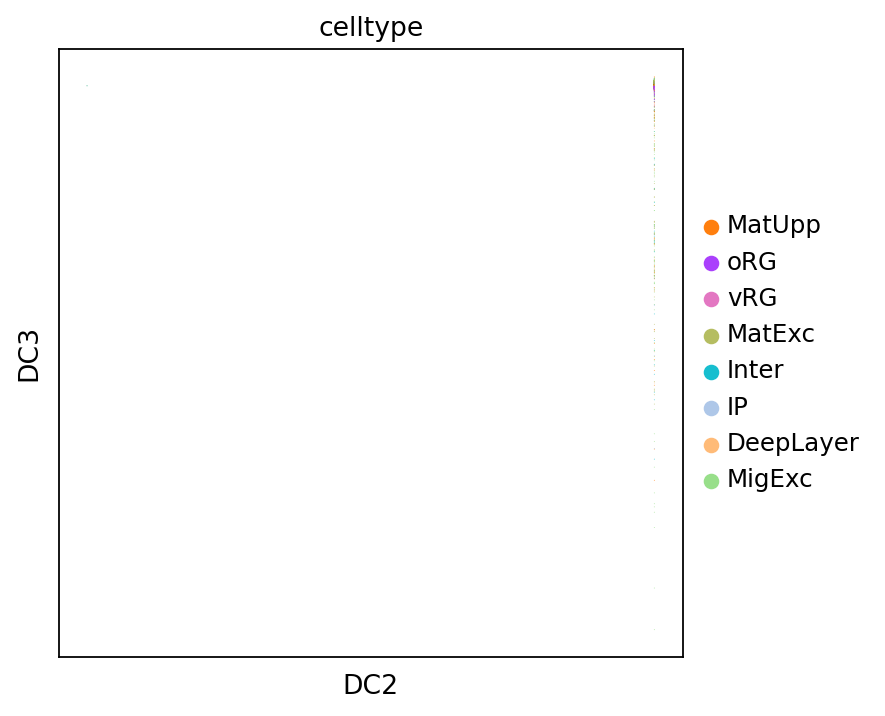

In [29]:
sc.pl.diffmap(tmp, color='celltype', dimensions=(1,2))

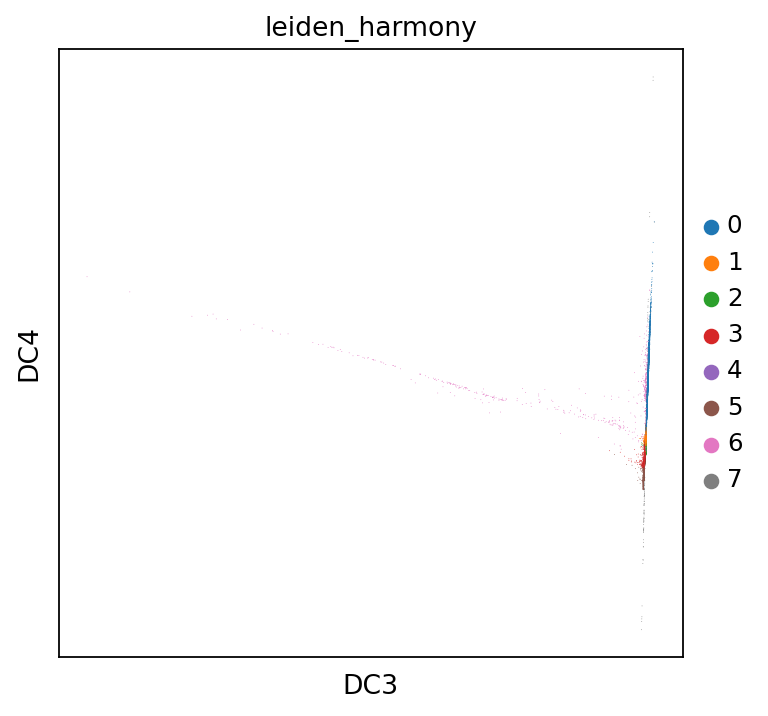

In [39]:
sc.pl.diffmap(tmp, color='leiden_harmony', dimensions=(2,3))

In [37]:
pd.crosstab(tmp.obs.stage, tmp.obs.leiden_harmony)

leiden_harmony,0,1,2,3,4,5,6,7
stage,,,,,,,,
CS14,10,353,700,3113,479,3123,5,77
CS15,77,108,20,1775,16,4428,3,150
CS19,4,12,3,202,66,757,0,15
CS22,8,226,224,735,205,765,1,5
GW15,2860,2696,2065,2383,799,1815,64,11
GW16,91,4728,1125,6019,1367,4837,3,1
GW17,148,2043,3295,1407,1103,1096,8,7
GW18,70,4237,6617,397,2229,266,3,3
GW19,40,6276,5365,790,4174,460,1,4


In [38]:
pd.crosstab(tmp.obs.celltype, tmp.obs.leiden_harmony)

leiden_harmony,0,1,2,3,4,5,6,7
celltype,,,,,,,,
MatUpp,1255,8463,57516,232,27715,146,79,43
oRG,0,0,0,36648,0,0,0,0
vRG,0,0,0,0,0,23292,0,0
MatExc,3141,21918,1273,647,636,420,190,106
Inter,1084,8884,528,255,266,154,74,57
IP,270,2173,123,87,77,70,22,11
DeepLayer,286,1867,159,93,64,44,32,11
MigExc,2780,17576,1365,700,721,433,183,124


After measuring the diffursion map of the remaining celltypes we observed a strange behaviour for cluster 6. Given the low number of cells constituting the cluster, being mostly MatExc from GW22, which is also well represented across the remaining leiden clusters, we decided to remove cluster 6

In [40]:
tmp2= tmp[~tmp.obs.leiden_harmony.isin(['6'])].copy()


In [42]:
sc.tl.diffmap(tmp2)

computing Diffusion Maps using n_comps=15(=n_dcs)
        initialized `.distances` `.connectivities` `.eigen_values` `.eigen_basis` `.distances_dpt`
computing transitions
    finished (0:00:02)
    eigenvalues of transition matrix
    [1.         0.9961711  0.99557453 0.99498117 0.99299806 0.99170417
     0.98106784 0.9756708  0.9754866  0.9747145  0.971783   0.97076195
     0.9664671  0.9653403  0.9626816 ]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:01:20)


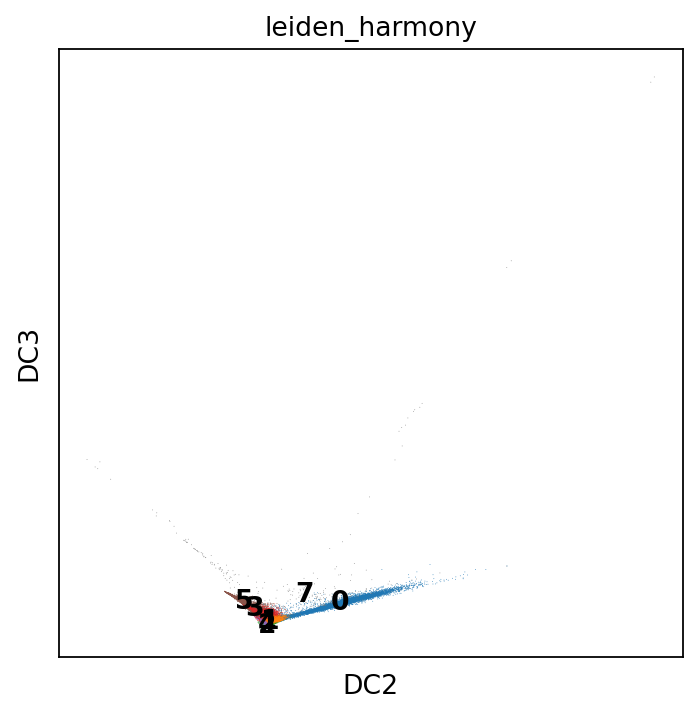

In [46]:
sc.pl.diffmap(tmp2, color='leiden_harmony', dimensions=(1,2), legend_loc='on data')

In [47]:
pd.crosstab(tmp2.obs.stage, tmp2.obs.leiden_harmony)

leiden_harmony,0,1,2,3,4,5,7
stage,,,,,,,
CS14,10,353,700,3113,479,3123,77
CS15,77,108,20,1775,16,4428,150
CS19,4,12,3,202,66,757,15
CS22,8,226,224,735,205,765,5
GW15,2860,2696,2065,2383,799,1815,11
GW16,91,4728,1125,6019,1367,4837,1
GW17,148,2043,3295,1407,1103,1096,7
GW18,70,4237,6617,397,2229,266,3
GW19,40,6276,5365,790,4174,460,4


In [48]:
pd.crosstab(tmp2.obs.celltype, tmp2.obs.leiden_harmony)

leiden_harmony,0,1,2,3,4,5,7
celltype,,,,,,,
MatUpp,1255,8463,57516,232,27715,146,43
oRG,0,0,0,36648,0,0,0
vRG,0,0,0,0,0,23292,0
MatExc,3141,21918,1273,647,636,420,106
Inter,1084,8884,528,255,266,154,57
IP,270,2173,123,87,77,70,11
DeepLayer,286,1867,159,93,64,44,11
MigExc,2780,17576,1365,700,721,433,124


After removing cluster 6, cluster 7 showed the same behaviour. 
This cluster is largely derived from early stages but it occupies the same cell-types.

In [22]:
# remove cluser 7 
tmp2= tmp2[~tmp2.obs.leiden_harmony.isin(['7'])].copy()


In [50]:
sc.tl.diffmap(tmp2)


computing Diffusion Maps using n_comps=15(=n_dcs)
        initialized `.distances` `.connectivities` `.eigen_values` `.eigen_basis` `.distances_dpt`
computing transitions
    finished (0:00:02)
    eigenvalues of transition matrix
    [ 1.          0.99640304  0.995575    0.99183017  0.9811546   0.9755538
      0.9718547   0.9668049   0.9654704   0.9628129   0.9626668   0.9587806
      0.95625395 -0.9564598  -0.96208656]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:01:11)


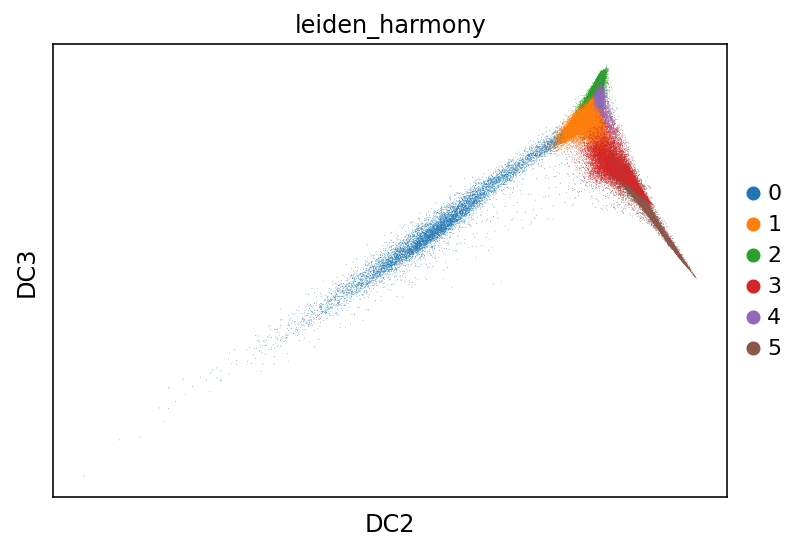

In [25]:
sc.pl.diffmap(tmp2, color='leiden_harmony', dimensions=(1,2))

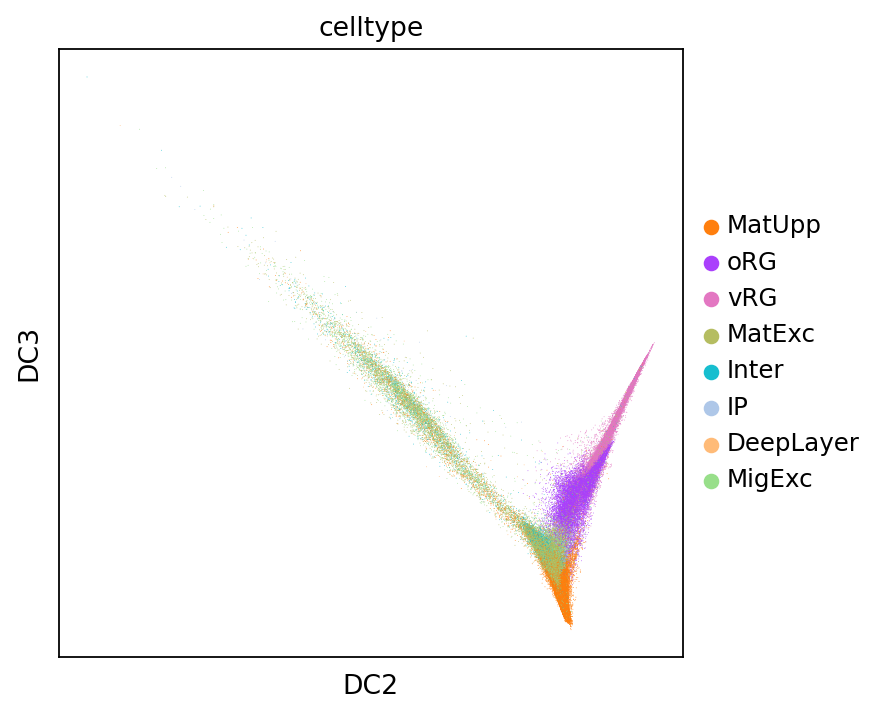

In [53]:
sc.pl.diffmap(tmp2, color='celltype', dimensions=(1,2))

In [55]:
tmp2.write_h5ad("/group/testa/Users/marina.fuster/dockerbase/ResultsOracle/results_diffmap_tmp.h5ad")

In [56]:
adata.write_h5ad("/group/testa/Users/marina.fuster/dockerbase/ResultsOracle/results_diffmap_adata.h5ad")

CHANGE TO THE OTHER SINGLUARITY

In [ ]:
tmp2 = sc.read_h5ad("/group/testa/Users/marina.fuster/dockerbase/ResultsOracle/results_diffmap_tmp.h5ad")
tmp2 

In [5]:
tmp2.obs.celltype.value_counts()

MatUpp       95327
oRG          36648
MatExc       28035
MigExc       23575
vRG          23292
Inter        11171
IP            2800
DeepLayer     2513
Name: celltype, dtype: int64

In [ ]:
sc.tl.diffmap(tmp2)

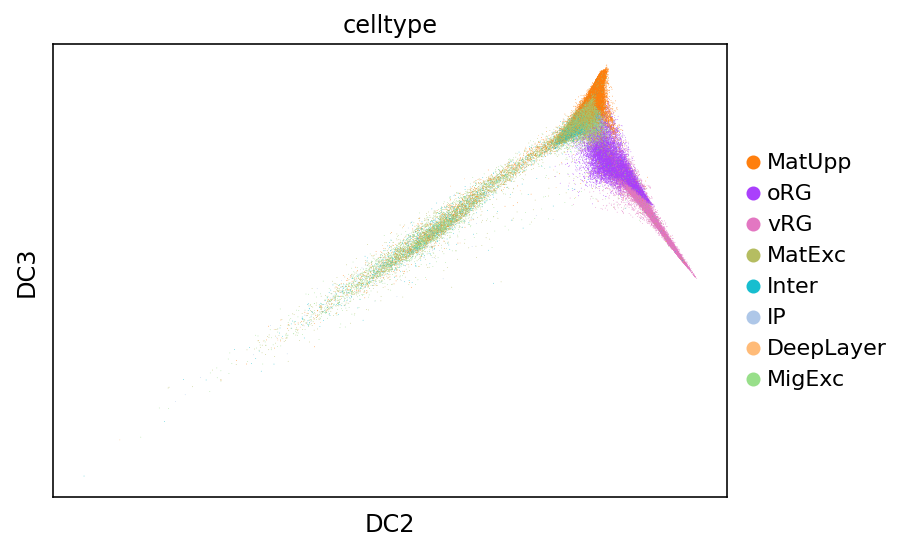

In [7]:
sc.pl.diffmap(tmp2, color='celltype', dimensions=(1,2))

In [14]:
sc.pp.neighbors(adata, n_neighbors=50, n_pcs=10)

In [15]:
sc.tl.draw_graph(tmp2, init_pos='diffmap', random_state=123)

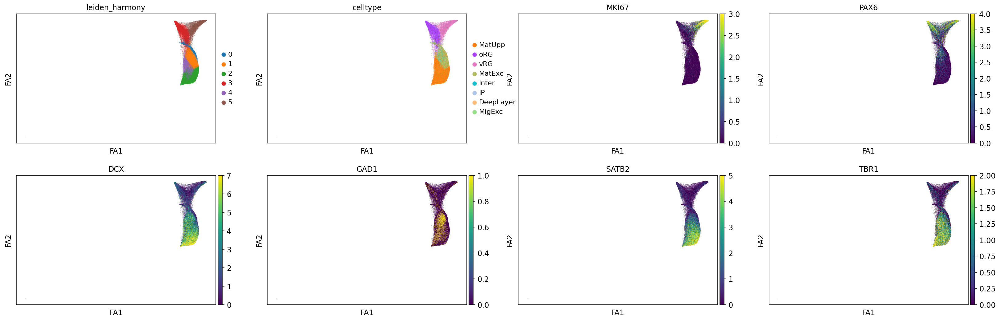

In [17]:
sc.pl.draw_graph(tmp2, color=['leiden_harmony','celltype','MKI67','PAX6','DCX','GAD1',"SATB2","TBR1"],vmin='p1',vmax='p99')

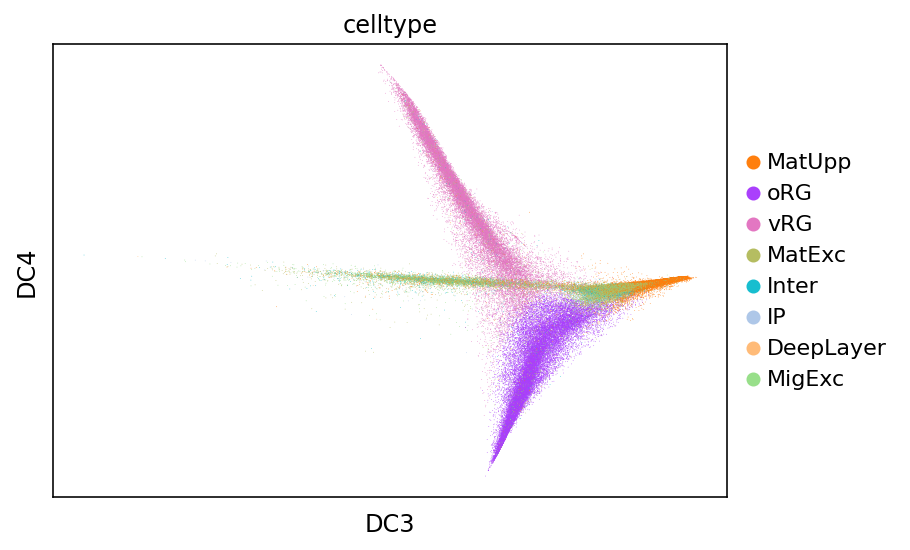

In [20]:
sc.pl.diffmap(tmp2, color='celltype', dimensions=(2,3))

In [18]:
tmp2.write_h5ad("/group/testa/Users/marina.fuster/dockerbase/ResultsOracle/results_draw_graph_tmp2.h5ad")

In [4]:
tmp2 = sc.read_h5ad("/group/testa/Users/marina.fuster/dockerbase/ResultsOracle/results_draw_graph_tmp2.h5ad")


In [5]:
tmp2.shape

(223361, 19914)

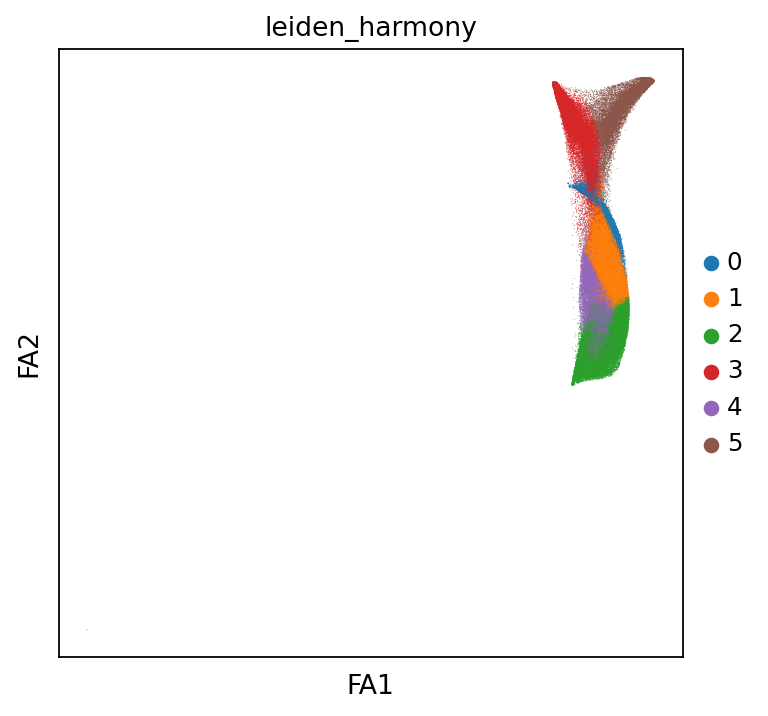

In [6]:
sc.pl.draw_graph(tmp2, color='leiden_harmony', vmin='p1',vmax='p99')

In [4]:
import celloracle as co
from celloracle import motif_analysis as ma
from celloracle.utility import save_as_pickled_object
from celloracle.applications import Pseudotime_calculator

In [5]:
import matplotlib.pyplot as plt
%matplotlib inline 

In [10]:
tmp2.obs_keys()

['phase',
 'stage',
 'celltype2',
 'Dataset',
 'n_genes',
 'n_genes_by_counts',
 'total_counts',
 'total_counts_mt',
 'pct_counts_mt',
 'total_counts_ribo',
 'pct_counts_ribo',
 'leiden',
 'celltype',
 'leiden_harmony',
 'IP_score',
 'GABA_score',
 'astro_score',
 'ERstress_score',
 'glycolysis_score',
 'hypoxia_score']

In [11]:
pt = Pseudotime_calculator(adata=tmp2,
                           obsm_key="X_draw_graph_fa", # Dimensional reduction data name
                           cluster_column_name="celltype" # Clustering data name
                           )

In [12]:
tmp2.obs.celltype.value_counts()

MatUpp       95327
oRG          36648
MatExc       28035
MigExc       23575
vRG          23292
Inter        11171
IP            2800
DeepLayer     2513
Name: celltype, dtype: int64

{'Lineage1': ['vRG', 'oRG', 'MigExc', 'MatUpp'],
 'Lineage2': ['vRG', 'IP', 'DeepLayer'],
 'Lineage3': ['vRG', 'MigExc', 'MatExc']}

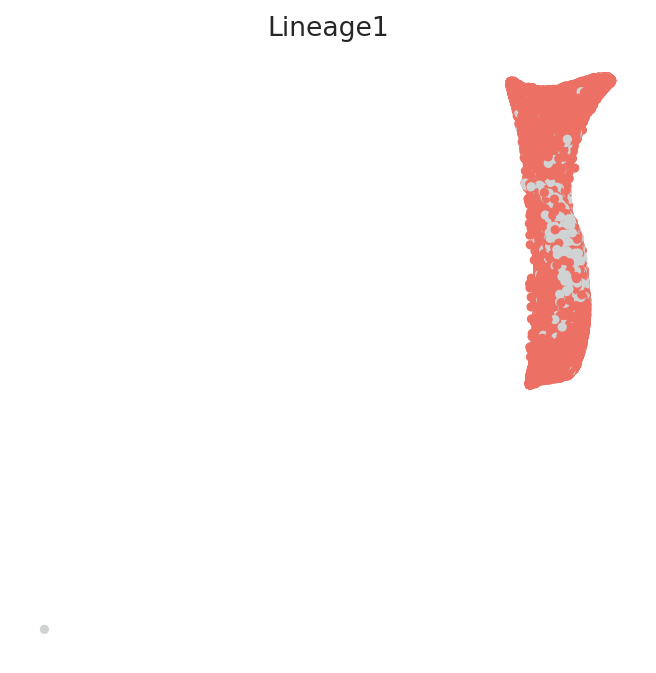

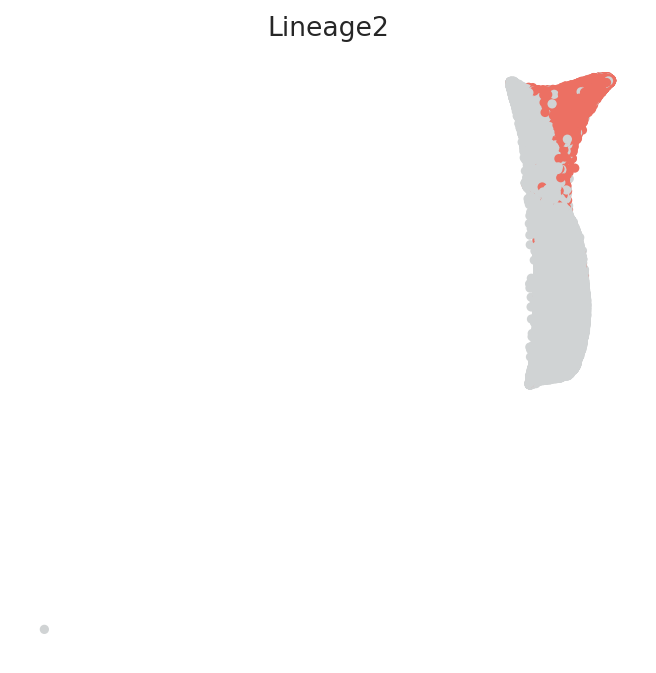

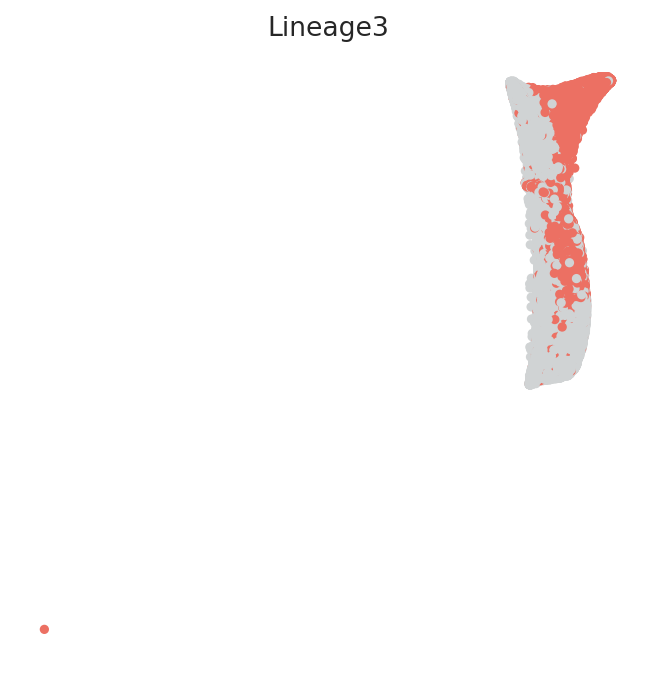

In [13]:
# Define lineages ==> PATHS

lineage1 = ['vRG','oRG','MigExc', 'MatUpp'] 
lineage2 = ['vRG','IP','DeepLayer']
lineage3 = ['vRG', 'MigExc', 'MatExc']

# Make a dictionary
lineage_dictionary = {"Lineage1": lineage1,
                      "Lineage2": lineage2,
                      "Lineage3": lineage3
}
lineage_dictionary

# Input lineage information into pseudotime object
pt.set_lineage(lineage_dictionary=lineage_dictionary)

# Visualize lineage information
pt.plot_lineages()

Clustering name:  celltype
Cluster list ['DeepLayer', 'IP', 'Inter', 'MatExc', 'MatUpp', 'MigExc', 'oRG', 'vRG']


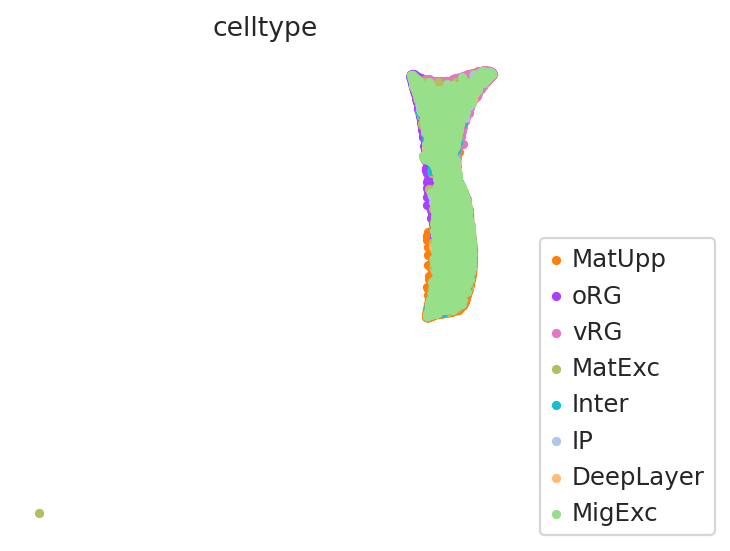

In [11]:
print("Clustering name: ", pt.cluster_column_name)
print("Cluster list", pt.cluster_list)
pt.plot_cluster(fontsize=11)

In [ ]:
import plotly
import plotly.express as px
def plot(adata, embedding_key, cluster_column_name):
    embedding = adata.obsm[embedding_key]
    df = pd.DataFrame(embedding, columns=["x", "y"])
    df["cluster"] = adata.obs[cluster_column_name].values
    df["label"] = adata.obs.index.values
    fig = px.scatter(df, x="x", y="y", hover_name=df["label"], color="cluster")
    fig.show()

plot(adata=pt.adata,
     embedding_key=pt.obsm_key,
     cluster_column_name=pt.cluster_column_name)

In [ ]:
# IDENTIFY THE OUTLIER CELL ( from interactive plot )
tmp2[tmp2.obs_names.isin(['TTATTGCAGAGTACCG-1'])]

In [ ]:
# REMOVING THE OULIER CELL! => every time we remove a cell the neighbours change ==> redo
tmp2 = tmp2[~tmp2.obs_names.isin(['TTATTGCAGAGTACCG-1'])]

In [ ]:
tmp2.var_names_make_unique()
tmp2.obs_names_make_unique()

In [31]:
adata = tmp2.copy()

extracting highly variable genes
    finished (0:00:22)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:04:42)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)


2024-06-07 18:28:58,823 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-06-07 18:28:58,823 - INFO - Computing initial centroids with sklearn.KMeans...
2024-06-07 18:29:56,722 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-06-07 18:29:56,722 - INFO - sklearn.KMeans initialization complete.
2024-06-07 18:29:57,819 - harmonypy - INFO - Iteration 1 of 20
2024-06-07 18:29:57,819 - INFO - Iteration 1 of 20
2024-06-07 18:31:55,409 - harmonypy - INFO - Iteration 2 of 20
2024-06-07 18:31:55,409 - INFO - Iteration 2 of 20
2024-06-07 18:34:00,138 - harmonypy - INFO - Iteration 3 of 20
2024-06-07 18:34:00,138 - INFO - Iteration 3 of 20
2024-06-07 18:36:05,977 - harmonypy - INFO - Iteration 4 of 20
2024-06-07 18:36:05,977 - INFO - Iteration 4 of 20
2024-06-07 18:36:57,940 - harmonypy - INFO - Iteration 5 of 20
2024-06-07 18:36:57,940 - INFO - Iteration 5 of 20
2024-06-07 18:37:49,870 - harmonypy - INFO - Iteration 6 of 20
2024-06-07 18:37:49,870 - INF

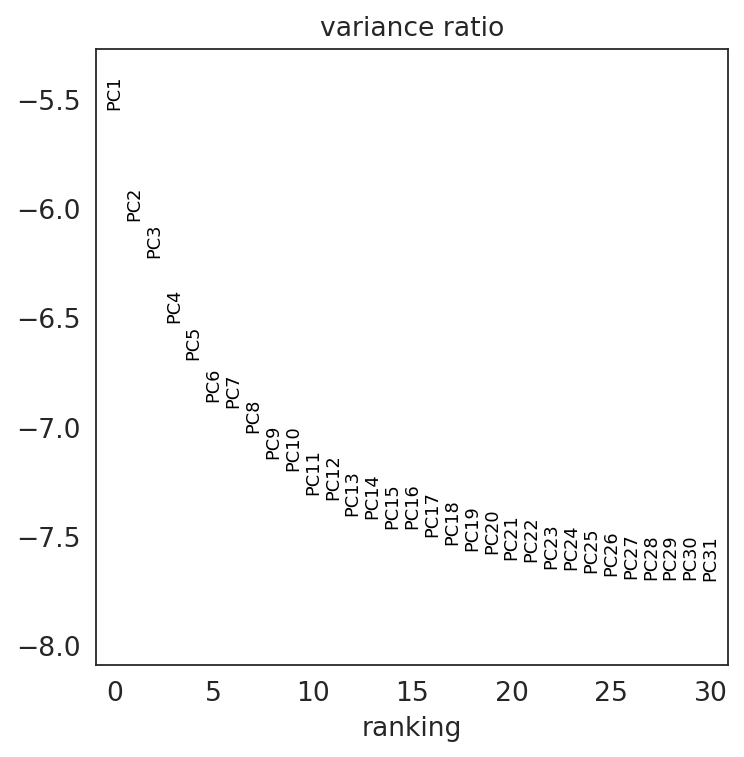

In [32]:
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=5, min_disp=0.5)

sc.tl.pca(adata, svd_solver='arpack', use_highly_variable=True)

sce.pp.harmony_integrate(adata, 'Dataset',adjusted_basis = "X_pca", max_iter_harmony = 20)

sc.pl.pca_variance_ratio(adata, log=True)

In [33]:
adata.write_h5ad("/group/testa/Users/marina.fuster/dockerbase/ResultsOracle/2024_06_07_Cleaned_harmony.h5ad")

In [34]:
sc.pp.neighbors(adata, n_neighbors=50, n_pcs=10)
sc.tl.leiden(adata, resolution=.5,key_added="leiden")

computing neighbors
        initialized `.distances` `.connectivities` `.eigen_values` `.eigen_basis` `.distances_dpt`
    computing neighbors
    using 'X_pca' with n_pcs = 10
    computed neighbors (0:00:59)
    computed connectivities (0:00:45)
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:01:48)
running Leiden clustering
    finished: found 15 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:28:34)


In [35]:
adata.write_h5ad("/group/testa/Users/marina.fuster/dockerbase/ResultsOracle/2024_06_07_Cleaned_leiden.h5ad")

computing UMAP


  0%|          | 0/200 [00:00<?, ?it/s]

	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:05:49)


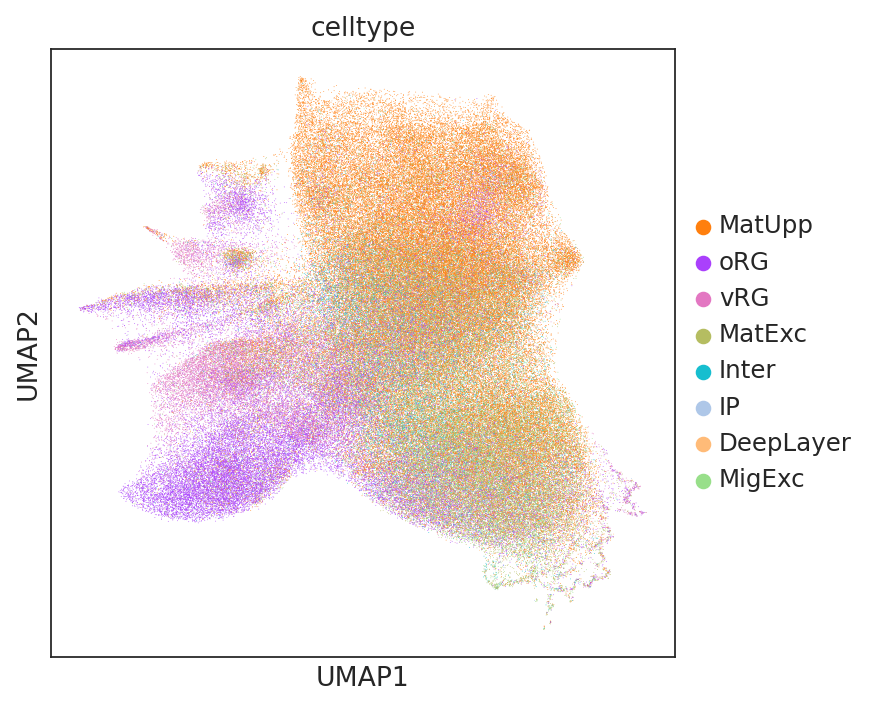

computing Diffusion Maps using n_comps=15(=n_dcs)
        initialized `.distances` `.connectivities` `.eigen_values` `.eigen_basis` `.distances_dpt`
computing transitions
    finished (0:00:01)
    eigenvalues of transition matrix
    [1.         0.9882164  0.98739123 0.98555666 0.98283166 0.9820749
     0.98000485 0.9774791  0.97694874 0.97504354 0.97267133 0.97160095
     0.9707073  0.9692993  0.9689944 ]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:48)


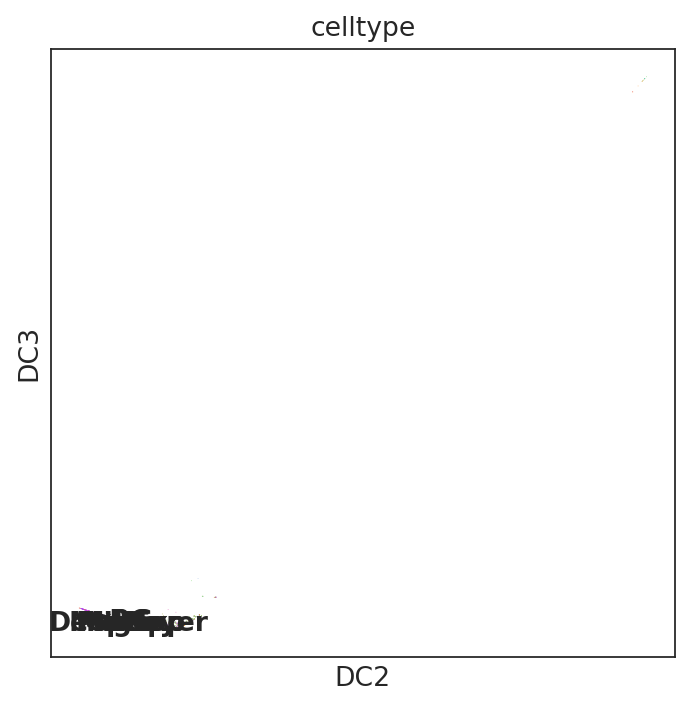

In [36]:

sc.tl.umap(adata, spread=1., min_dist=.5, random_state=11)

sc.pl.umap(adata,color="celltype")


sc.tl.diffmap(adata)

sc.pl.diffmap(adata,color="celltype",dimensions=(1,2),legend_loc="on data",save="celltype")


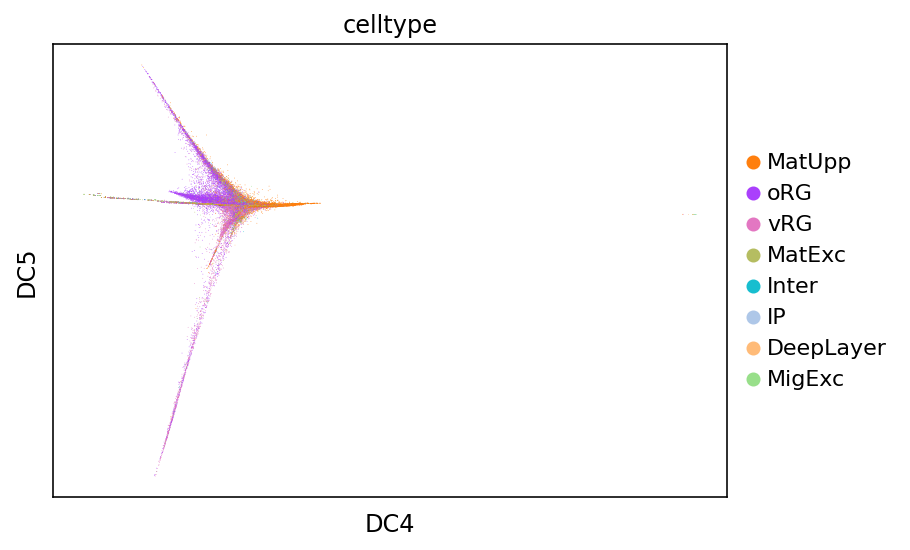

In [8]:
sc.pl.diffmap(adata,color="celltype",dimensions=(3,4), save="celltype")


In [37]:
adata.write_h5ad("/group/testa/Users/marina.fuster/dockerbase/ResultsOracle/2024_06_07_Cleaned_diffmap.h5ad")

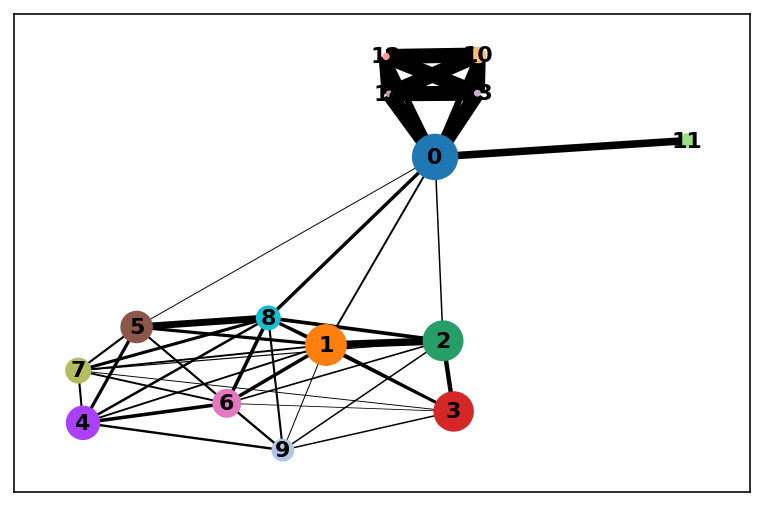

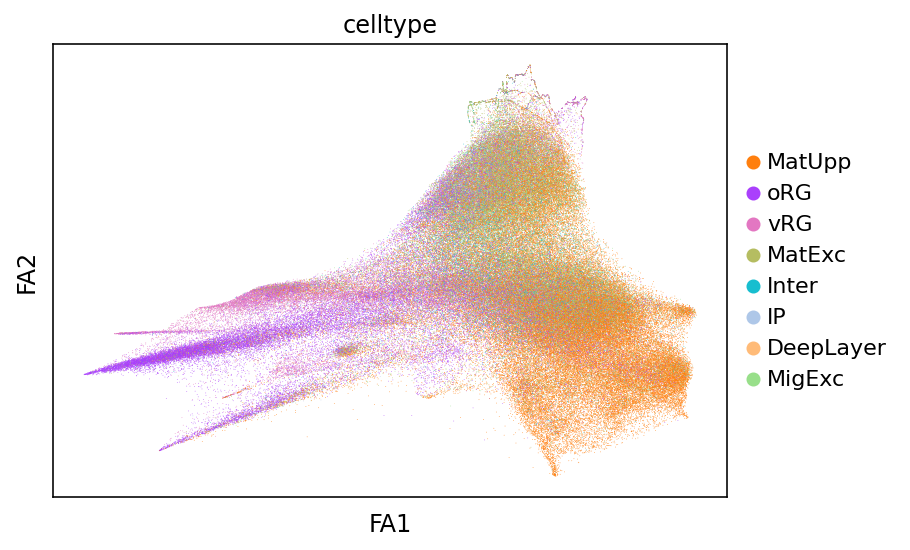

In [6]:

sc.tl.paga(adata)

sc.pl.paga(adata,threshold=0.05)

sc.tl.draw_graph(adata,init_pos="paga")

sc.pl.draw_graph(adata,color="celltype")


In [7]:
adata.write_h5ad("/group/testa/Users/marina.fuster/dockerbase/ResultsOracle/2024_06_07_Cleaned_drawgraph_paga.h5ad")

In [3]:
adata = sc.read_h5ad("/group/testa/Users/marina.fuster/dockerbase/ResultsOracle/2024_06_07_Cleaned_drawgraph_paga.h5ad")

In [4]:
adata.obs

,phase,stage,celltype2,Dataset,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,pct_counts_ribo,leiden,celltype,leiden_harmony,IP_score,GABA_score,astro_score,ERstress_score,glycolysis_score,hypoxia_score
AAACCTGAGACTAGAT-1,G1,GW25,MatExc,0,1507,1507,3135.0,52.0,1.658692,247.0,7.878788,1,MatUpp,4,-0.396409,-0.594960,-0.441628,-0.013333,1.256667,-0.01
AAACCTGAGCTAAGAT-1,G2M,GW25,MigExc,0,2100,2100,4524.0,89.0,1.967286,358.0,7.913351,1,MatUpp,2,-0.335715,-0.481703,-0.555402,-0.340000,-2.226667,-0.01
AAACCTGAGGACGAAA-1,G1,GW25,MatExc,0,1492,1491,3222.0,54.0,1.675978,309.0,9.590317,1,MatExc,1,-0.304543,-0.719876,-0.390359,-0.033333,0.953333,-0.04
AAACCTGAGTCAATAG-1,G2M,GW25,MatUpp,0,2688,2687,7090.0,124.0,1.748942,635.0,8.956277,2,MatExc,2,-0.514791,-0.391230,-0.500407,-0.106667,0.873333,-0.07
AAACCTGAGTCATCCA-1,S,GW25,MatUpp,0,1167,1167,2164.0,48.0,2.218115,289.0,13.354899,1,Inter,2,-0.354111,-0.272154,-0.236852,-0.140000,-0.783333,-0.01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCAGTGTGCGTC-1-1,G1,GW22,oRG,30,290,290,466.0,23.0,4.935622,87.0,18.669527,1,oRG,3,-0.030872,-0.164386,-0.086502,-0.015000,-0.016667,-0.01
TTTGTCATCATAGCAC-1-1,G1,GW22,MatUpp,30,383,383,635.0,22.0,3.464567,97.0,15.275590,0,MatExc,2,-0.107302,-0.073635,-0.014854,-0.015000,-0.156667,0.00
TTTGTCATCGGCGGTT-1-1,S,GW22,oRG,30,353,353,556.0,22.0,3.956835,80.0,14.388490,0,oRG,3,-0.067632,-0.099173,0.988714,0.303333,-0.600000,-0.01
TTTGTCATCTACCAGA-1-1,G1,GW22,oRG,30,494,494,782.0,21.0,2.685422,92.0,11.764706,1,oRG,3,-0.181403,-0.446075,2.289936,-0.020000,1.006667,-0.03


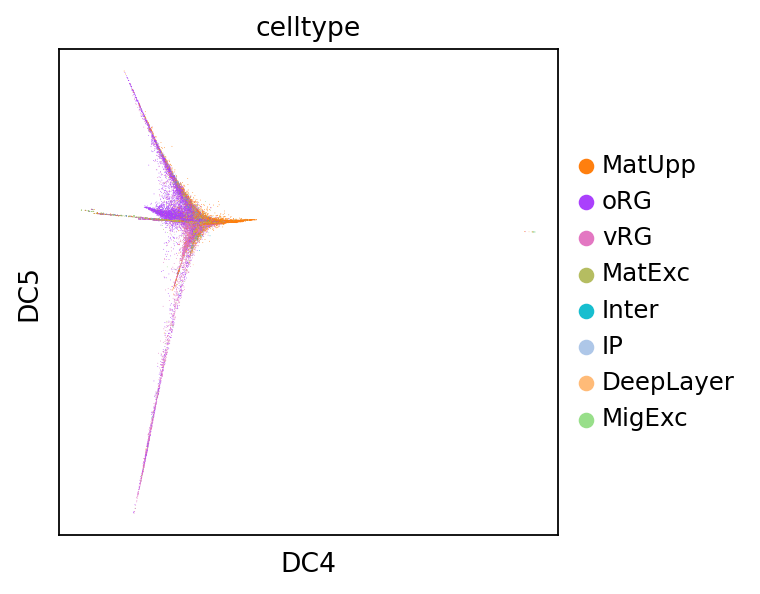

In [15]:
sc.pl.diffmap(adata,color='celltype',dimensions=(3,4), save="celltype")


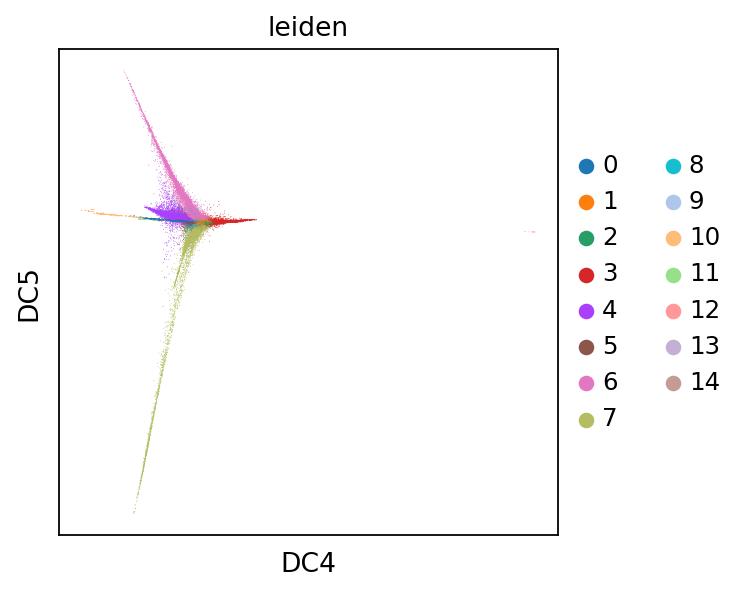

In [16]:
sc.pl.diffmap(adata,color="leiden" ,dimensions=(3,4), save="celltype")

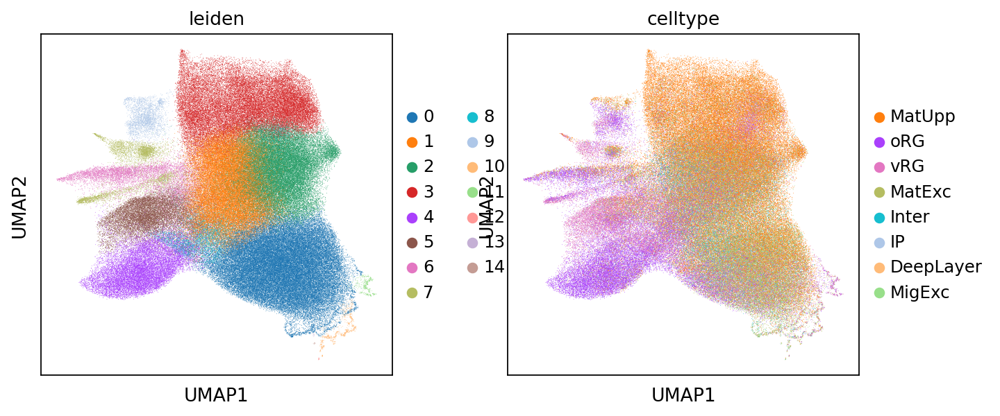

In [12]:
sc.pl.umap(adata,color=["leiden", 'celltype'])


In [6]:
pt = Pseudotime_calculator(adata=adata,
                           obsm_key="X_draw_graph_fa", # Dimensional reduction data name
                           cluster_column_name="celltype" # Clustering data name
                           )

In [7]:
adata.obs

,phase,stage,celltype2,Dataset,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,pct_counts_ribo,leiden,celltype,leiden_harmony,IP_score,GABA_score,astro_score,ERstress_score,glycolysis_score,hypoxia_score
AAACCTGAGACTAGAT-1,G1,GW25,MatExc,0,1507,1507,3135.0,52.0,1.658692,247.0,7.878788,1,MatUpp,4,-0.396409,-0.594960,-0.441628,-0.013333,1.256667,-0.01
AAACCTGAGCTAAGAT-1,G2M,GW25,MigExc,0,2100,2100,4524.0,89.0,1.967286,358.0,7.913351,1,MatUpp,2,-0.335715,-0.481703,-0.555402,-0.340000,-2.226667,-0.01
AAACCTGAGGACGAAA-1,G1,GW25,MatExc,0,1492,1491,3222.0,54.0,1.675978,309.0,9.590317,1,MatExc,1,-0.304543,-0.719876,-0.390359,-0.033333,0.953333,-0.04
AAACCTGAGTCAATAG-1,G2M,GW25,MatUpp,0,2688,2687,7090.0,124.0,1.748942,635.0,8.956277,2,MatExc,2,-0.514791,-0.391230,-0.500407,-0.106667,0.873333,-0.07
AAACCTGAGTCATCCA-1,S,GW25,MatUpp,0,1167,1167,2164.0,48.0,2.218115,289.0,13.354899,1,Inter,2,-0.354111,-0.272154,-0.236852,-0.140000,-0.783333,-0.01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCAGTGTGCGTC-1-1,G1,GW22,oRG,30,290,290,466.0,23.0,4.935622,87.0,18.669527,1,oRG,3,-0.030872,-0.164386,-0.086502,-0.015000,-0.016667,-0.01
TTTGTCATCATAGCAC-1-1,G1,GW22,MatUpp,30,383,383,635.0,22.0,3.464567,97.0,15.275590,0,MatExc,2,-0.107302,-0.073635,-0.014854,-0.015000,-0.156667,0.00
TTTGTCATCGGCGGTT-1-1,S,GW22,oRG,30,353,353,556.0,22.0,3.956835,80.0,14.388490,0,oRG,3,-0.067632,-0.099173,0.988714,0.303333,-0.600000,-0.01
TTTGTCATCTACCAGA-1-1,G1,GW22,oRG,30,494,494,782.0,21.0,2.685422,92.0,11.764706,1,oRG,3,-0.181403,-0.446075,2.289936,-0.020000,1.006667,-0.03


In [8]:
adata.obs.celltype.value_counts()

MatUpp       95327
oRG          36648
MatExc       28034
MigExc       23575
vRG          23292
Inter        11171
IP            2800
DeepLayer     2513
Name: celltype, dtype: int64

In [9]:
tmp3 = adata[adata.obs.celltype == "vRG",:].copy()
tmp3.obs_names[tmp3[:,'TOP2A'].X.argmax()]

'GGGACCTTCAACACGT-1'

{'Lineage1': ['vRG', 'oRG', 'MigExc', 'MatUpp'],
 'Lineage2': ['vRG', 'IP', 'DeepLayer'],
 'Lineage3': ['vRG', 'MigExc', 'MatExc']}

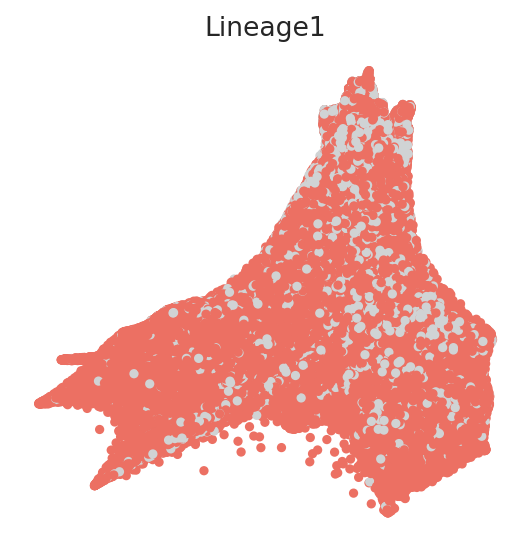

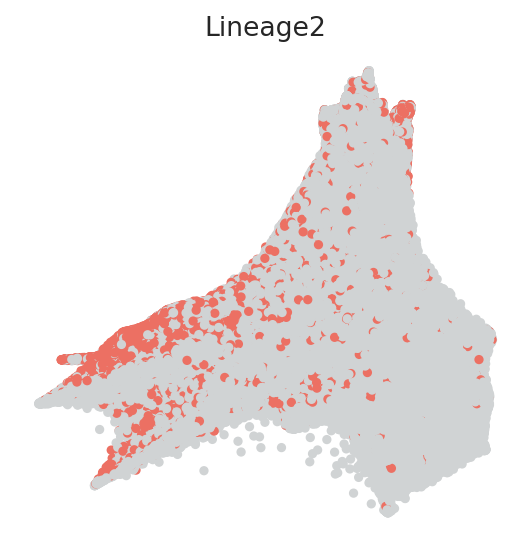

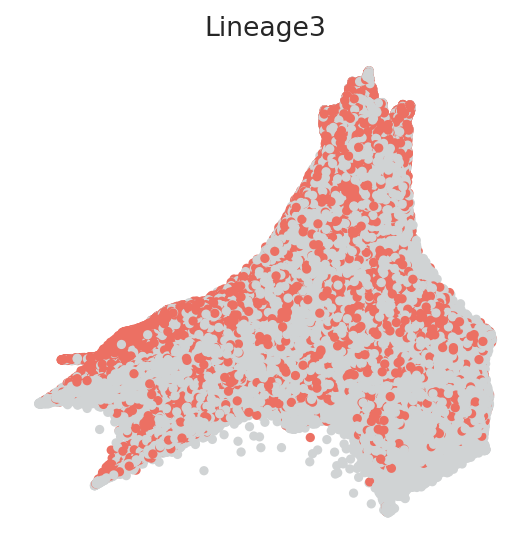

In [11]:
# Define lineages ==> PATHS

lineage1 = ['vRG','oRG','MigExc', 'MatUpp'] 
lineage2 = ['vRG','IP','DeepLayer']
lineage3 = ['vRG', 'MigExc', 'MatExc']

# Make a dictionary
lineage_dictionary = {"Lineage1": lineage1,
                      "Lineage2": lineage2,
                      "Lineage3": lineage3
}
lineage_dictionary

# Input lineage information into pseudotime object
pt.set_lineage(lineage_dictionary=lineage_dictionary)

# Visualize lineage information
pt.plot_lineages()

In [12]:
# paste the name of the root cells from above following the example

root_cells = {'Lineage1': 'GGGACCTTCAACACGT-1', 'Lineage2': 'GGGACCTTCAACACGT-1', 'Lineage3': 'GGGACCTTCAACACGT-1' }
pt.set_root_cells(root_cells=root_cells)

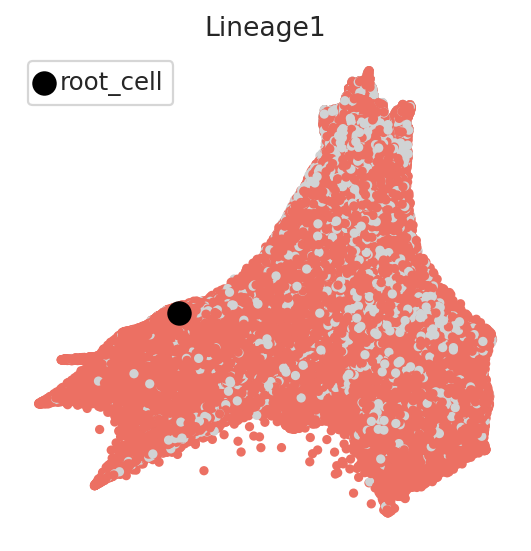

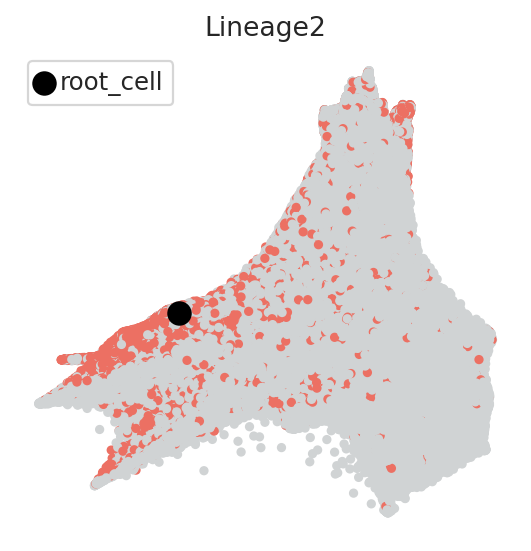

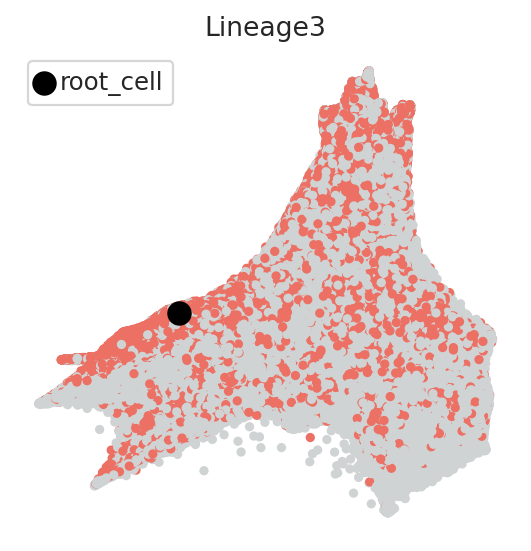

In [13]:
pt.plot_root_cells()

In [14]:
# check diffusion map
"X_diffmap" in pt.adata.obsm

True

In [15]:
adata.shape

(223360, 19914)

In [16]:
adata.obs.keys()

Index(['phase', 'stage', 'celltype2', 'Dataset', 'n_genes',
       'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt',
       'total_counts_ribo', 'pct_counts_ribo', 'leiden', 'celltype',
       'leiden_harmony', 'IP_score', 'GABA_score', 'astro_score',
       'ERstress_score', 'glycolysis_score', 'hypoxia_score'],
      dtype='object')

In [ ]:
#adata = tmp2[tmp2.obs.isin(['stage','Dataset','leiden_harmony','celltype'])].copy()

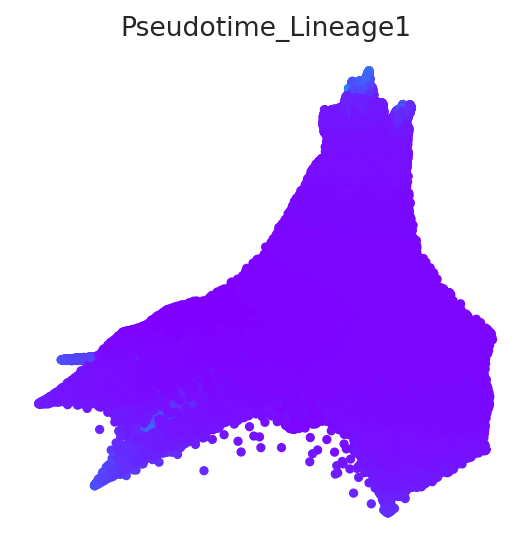

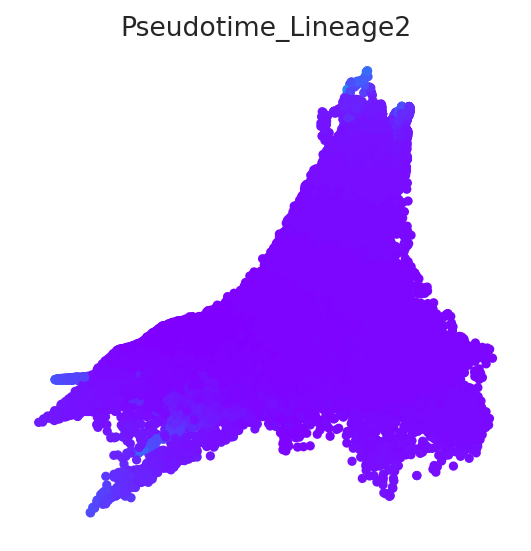

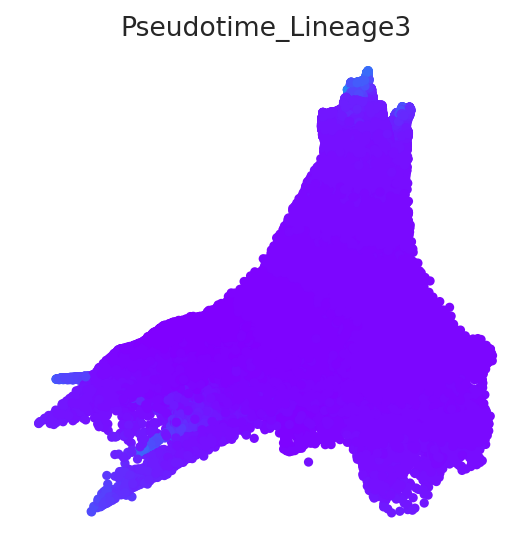

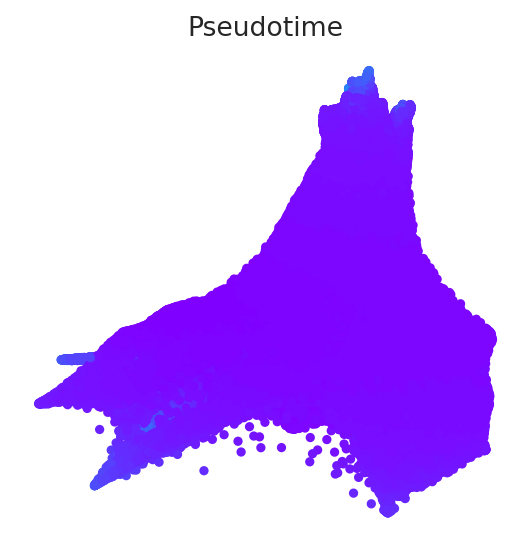

In [17]:
# Calculate pseudotime
pt.get_pseudotime_per_each_lineage()
pt.plot_pseudotime(cmap="rainbow")

In [18]:
# Check result
pt.adata.obs[["Pseudotime"]].head()

,Pseudotime
AAACCTGAGACTAGAT-1,0.008349
AAACCTGAGCTAAGAT-1,0.011797
AAACCTGAGGACGAAA-1,0.008190
AAACCTGAGTCAATAG-1,0.011659
AAACCTGAGTCATCCA-1,0.006832


In [19]:
pt.adata.obs

,phase,stage,celltype2,Dataset,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,...,ERstress_score,glycolysis_score,hypoxia_score,Lineage1,Lineage2,Lineage3,Pseudotime_Lineage1,Pseudotime_Lineage2,Pseudotime_Lineage3,Pseudotime
AAACCTGAGACTAGAT-1,G1,GW25,MatExc,0,1507,1507,3135.0,52.0,1.658692,247.0,...,-0.013333,1.256667,-0.01,True,False,False,0.008349,NaN,NaN,0.008349
AAACCTGAGCTAAGAT-1,G2M,GW25,MigExc,0,2100,2100,4524.0,89.0,1.967286,358.0,...,-0.340000,-2.226667,-0.01,True,False,False,0.011797,NaN,NaN,0.011797
AAACCTGAGGACGAAA-1,G1,GW25,MatExc,0,1492,1491,3222.0,54.0,1.675978,309.0,...,-0.033333,0.953333,-0.04,False,False,True,NaN,NaN,0.008190,0.008190
AAACCTGAGTCAATAG-1,G2M,GW25,MatUpp,0,2688,2687,7090.0,124.0,1.748942,635.0,...,-0.106667,0.873333,-0.07,False,False,True,NaN,NaN,0.011659,0.011659
AAACCTGAGTCATCCA-1,S,GW25,MatUpp,0,1167,1167,2164.0,48.0,2.218115,289.0,...,-0.140000,-0.783333,-0.01,False,False,False,NaN,NaN,NaN,0.006832
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCAGTGTGCGTC-1-1,G1,GW22,oRG,30,290,290,466.0,23.0,4.935622,87.0,...,-0.015000,-0.016667,-0.01,True,False,False,0.005905,NaN,NaN,0.005905
TTTGTCATCATAGCAC-1-1,G1,GW22,MatUpp,30,383,383,635.0,22.0,3.464567,97.0,...,-0.015000,-0.156667,0.00,False,False,True,NaN,NaN,0.020536,0.020536
TTTGTCATCGGCGGTT-1-1,S,GW22,oRG,30,353,353,556.0,22.0,3.956835,80.0,...,0.303333,-0.600000,-0.01,True,False,False,0.012622,NaN,NaN,0.012622
TTTGTCATCTACCAGA-1-1,G1,GW22,oRG,30,494,494,782.0,21.0,2.685422,92.0,...,-0.020000,1.006667,-0.03,True,False,False,0.003429,NaN,NaN,0.003429


In [ ]:
tmp2.obs = pt.adata.obs

In [22]:
adata.obs = pt.adata.obs
# Save updated anndata object

In [23]:
adata.obs

,phase,stage,celltype2,Dataset,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,...,ERstress_score,glycolysis_score,hypoxia_score,Lineage1,Lineage2,Lineage3,Pseudotime_Lineage1,Pseudotime_Lineage2,Pseudotime_Lineage3,Pseudotime
AAACCTGAGACTAGAT-1,G1,GW25,MatExc,0,1507,1507,3135.0,52.0,1.658692,247.0,...,-0.013333,1.256667,-0.01,True,False,False,0.008349,NaN,NaN,0.008349
AAACCTGAGCTAAGAT-1,G2M,GW25,MigExc,0,2100,2100,4524.0,89.0,1.967286,358.0,...,-0.340000,-2.226667,-0.01,True,False,False,0.011797,NaN,NaN,0.011797
AAACCTGAGGACGAAA-1,G1,GW25,MatExc,0,1492,1491,3222.0,54.0,1.675978,309.0,...,-0.033333,0.953333,-0.04,False,False,True,NaN,NaN,0.008190,0.008190
AAACCTGAGTCAATAG-1,G2M,GW25,MatUpp,0,2688,2687,7090.0,124.0,1.748942,635.0,...,-0.106667,0.873333,-0.07,False,False,True,NaN,NaN,0.011659,0.011659
AAACCTGAGTCATCCA-1,S,GW25,MatUpp,0,1167,1167,2164.0,48.0,2.218115,289.0,...,-0.140000,-0.783333,-0.01,False,False,False,NaN,NaN,NaN,0.006832
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCAGTGTGCGTC-1-1,G1,GW22,oRG,30,290,290,466.0,23.0,4.935622,87.0,...,-0.015000,-0.016667,-0.01,True,False,False,0.005905,NaN,NaN,0.005905
TTTGTCATCATAGCAC-1-1,G1,GW22,MatUpp,30,383,383,635.0,22.0,3.464567,97.0,...,-0.015000,-0.156667,0.00,False,False,True,NaN,NaN,0.020536,0.020536
TTTGTCATCGGCGGTT-1-1,S,GW22,oRG,30,353,353,556.0,22.0,3.956835,80.0,...,0.303333,-0.600000,-0.01,True,False,False,0.012622,NaN,NaN,0.012622
TTTGTCATCTACCAGA-1-1,G1,GW22,oRG,30,494,494,782.0,21.0,2.685422,92.0,...,-0.020000,1.006667,-0.03,True,False,False,0.003429,NaN,NaN,0.003429


In [24]:
adata.write_h5ad("/group/testa/Users/marina.fuster/dockerbase/CellOracle/PostPseudoTimeFull.h5ad")